In [192]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# import os
# import ffmpeg


# def extract_frames(video_path, output_folder, interval):
#     os.makedirs(output_folder, exist_ok=True)

#     ffmpeg.input(video_path, ss=0).output(
#         f"{output_folder}frame_%03d.png", vf=f"fps=1/{interval}"
#     ).run()


# def track_actuator_tip(
#     frame_folder,
#     start_frame,
#     end_frame=None,
#     output_file="tip_positions.csv",
#     min_area=10,  # Adjust based on your actuator size
# ):
#     # Get list of frames
#     frames = sorted(
#         [
#             os.path.join(frame_folder, f)
#             for f in os.listdir(frame_folder)
#             if f.endswith((".png", ".jpg"))
#         ]
#     )

#     start_frame = max(0, start_frame)
#     end_frame = min(len(frames), end_frame if end_frame is not None else len(frames))
#     print(f"Analyzing frames {start_frame} to {end_frame-1}")
#     print(f"Total frames used: {end_frame - start_frame}")

#     frames = frames[start_frame:end_frame]

#     # Arrays to store positions
#     tip_positions = []
#     frame_times = []

#     # Keep previous frame for motion detection
#     prev_frame = None

#     # For visualization
#     plt.figure(figsize=(12, 10))

#     for i, frame_path in enumerate(frames):
#         # Read the frame
#         frame = cv2.imread(frame_path)
#         frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

#         # Convert to grayscale
#         gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

#         # Apply Gaussian blur to reduce noise
#         blurred = cv2.GaussianBlur(gray, (5, 5), 0)

#         # Use adaptive thresholding instead of fixed threshold
#         thresh = cv2.adaptiveThreshold(
#             blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
#         )

#         # Apply morphological operations to clean up the threshold
#         kernel = np.ones((3, 3), np.uint8)  # Slightly larger kernel
#         opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)  # More iterations
#         closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=2)  # More iterations
#         final_thresh = closing

#         # Convert BGR to RGB for matplotlib
#         rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

#         # Find contours
#         contours, _ = cv2.findContours(
#             final_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
#         )

#         # Create a visualization image
#         result = frame_rgb.copy()

#         # Find the actuator contour
#         tip_point = None
#         # if contours:
#         #     # Filter contours by area to exclude small noise
#         #     valid_contours = [c for c in contours if cv2.contourArea(c) > min_area]
#         #     all_contour_points = np.vstack(valid_contours) if valid_contours else None
#         #     # import pdb; pdb.set_trace()

#         #     # if all_contour_points:
#         #         # sorted_contours = sorted(
#         #         #     valid_contours, 
#         #         #     key=lambda c: (
#         #         #         cv2.boundingRect(c)[0] + cv2.boundingRect(c)[2],  # x + width (rightmost point)
#         #         #         cv2.boundingRect(c)[1] + cv2.boundingRect(c)[3]   # y + height (bottommost point)
#         #         #     ),
#         #         #     reverse=True  # Sort in descending order
#         #         # )
                
#         #         # # Get the contour with the largest x and y values (furthest bottom-right)
#         #         # actuator_contour = sorted_contours[0]
                
#         #         # Draw the contour
#         #     cv2.drawContours(result, [all_contour_points], -1, (0, 255, 0), 2)
            
#         #     # Find the bottom-most point of this contour
#         #     tip_point = tuple(
#         #         all_contour_points[all_contour_points[:, :, 1].argmax()][0]
#         #     )
            
#         #     # Draw the tip point
#         #     cv2.circle(result, tip_point, 5, (0, 0, 255), -1)

#         valid_contours = [c for c in contours if cv2.contourArea(c) > min_area]
#         if valid_contours:
#             # Create a mask from contours
#             mask = np.zeros(gray.shape, dtype=np.uint8)
#             cv2.drawContours(mask, valid_contours, -1, 255, -1)
            
#             # Get skeleton
#             skeleton = cv2.ximgproc.thinning(mask)
            
#             # Find endpoints of the skeleton
#             kernel = np.uint8([[1, 1, 1],
#                             [1, 10, 1],
#                             [1, 1, 1]])
            
#             filtered = cv2.filter2D(skeleton.astype(np.uint8), -1, kernel)
            
#             # Endpoints have value 11 in the filtered image (one neighbor + center point)
#             endpoints = np.where(filtered == 11)
            
#             if len(endpoints[0]) > 0:
#                 # If multiple endpoints, pick the one furthest from the base
#                 # (assuming base is at the left side in your image)
#                 max_distance = 0
#                 tip_index = 0
                
#                 for i in range(len(endpoints[0])):
#                     point_x = endpoints[1][i]  # x coordinate
#                     # Distance from left edge
#                     if point_x > max_distance:
#                         max_distance = point_x
#                         tip_index = i
                
#                 # Get the endpoint coordinates
#                 tip_y = endpoints[0][tip_index]
#                 tip_x = endpoints[1][tip_index]
#                 tip_point = (tip_x, tip_y)
                
#                 cv2.circle(result, tip_point, 5, (0, 0, 255), -1)
        

#         # Create a figure with subplots for visualization
#         fig, axes = plt.subplots(2, 3, figsize=(15, 10))

#         # Display each stage
#         axes[0, 0].imshow(frame_rgb)
#         axes[0, 0].set_title('Original')
#         axes[0, 0].axis('off')

#         axes[0, 1].imshow(gray, cmap='gray')
#         axes[0, 1].set_title('Grayscale')
#         axes[0, 1].axis('off')

#         axes[0, 2].imshow(thresh, cmap='gray')
#         axes[0, 2].set_title('Thresholded')
#         axes[0, 2].axis('off')

#         axes[1, 0].imshow(opening, cmap='gray')
#         axes[1, 0].set_title('After Opening')
#         axes[1, 0].axis('off')

#         axes[1, 1].imshow(closing, cmap='gray')
#         axes[1, 1].set_title('After Closing')
#         axes[1, 1].axis('off')

#         axes[1, 2].imshow(mask, cmap='gray')
#         axes[1, 2].set_title('Final Mask')
#         axes[1, 2].axis('off')

#         plt.tight_layout()
#         plt.show()

        
#         # Create a colorful visualization of the filtered image
#         # to better show the values
#         filtered_viz = np.zeros_like(filtered)
#         filtered_viz = np.clip(filtered, 0, 15)  # Limit range for better visualization
#         filtered_viz = (filtered_viz / 15.0 * 255).astype(np.uint8)  # Normalize to 0-255
        
#         axes[1, 1].imshow(filtered_viz, cmap='viridis')
#         axes[1, 1].set_title('Filtered (Endpoints Detection)')
#         axes[1, 1].axis('off')
        
#         # Show result with the tip point
#         result_img = rgb_frame.copy()
#         if tip_point:
#             cv2.circle(result_img, tip_point, 10, (255, 0, 0), -1)
        
#         axes[1, 2].imshow(result_img)
#         axes[1, 2].set_title('Result with Tip Point')
#         axes[1, 2].axis('off')
        
#         plt.tight_layout()
#         plt.show()


#         # if valid_contours:
#         #     # Combine all contours
#         #     mask = np.zeros(gray.shape, dtype=np.uint8)
#         #     cv2.drawContours(mask, valid_contours, -1, 255, -1)
            
#         #     # Find the combined contour
#         #     combined_contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#         #     main_contour = combined_contours[0]
            
#         #     # Calculate convexity defects
#         #     hull = cv2.convexHull(main_contour, returnPoints=False)
            
#         #     if len(hull) > 3:  # Need at least 4 points for convexity defects
#         #         defects = cv2.convexityDefects(main_contour, hull)
                
#         #         if defects is not None:
#         #             # Find the farthest point (biggest convexity defect)
#         #             max_distance = 0
#         #             farthest_point = None
                    
#         #             for i in range(defects.shape[0]):
#         #                 s, e, f, d = defects[i, 0]
#         #                 far = tuple(main_contour[f][0])
#         #                 distance = d / 256.0  # Convert to actual distance
                        
#         #                 if distance > max_distance:
#         #                     max_distance = distance
#         #                     farthest_point = far
                    
#         #             # If we found a far point, it's likely the tip
#         #             if farthest_point:
#         #                 tip_point = farthest_point
#         #                 cv2.circle(result, tip_point, 5, (0, 0, 255), -1)


#         # Store the tip position
#         if tip_point is not None:
#             tip_positions.append(tip_point)
#             frame_times.append(i)

#             # Draw the detected tip
#             cv2.circle(result, tuple(tip_point), 10, (255, 0, 0), -1)

#             # Draw a label
#             cv2.putText(
#                 result,
#                 f"Tip ({tip_point[0]}, {tip_point[1]})",
#                 (tip_point[0] + 15, tip_point[1]),
#                 cv2.FONT_HERSHEY_SIMPLEX,
#                 0.7,
#                 (255, 0, 0),
#                 2,
#             )

#             # Display the frame with detected tip and contour
#             plt.subplot(1, 2, 1)
#             plt.imshow(result)
#             plt.title(f"Frame {i} - Detected Tip")
#             plt.axis("off")

#             # Plot the trajectory so far
#             if len(tip_positions) > 1:
#                 tip_array = np.array(tip_positions)
#                 plt.subplot(1, 2, 2)
#                 plt.plot(tip_array[:, 0], tip_array[:, 1], "b-o")
#                 plt.scatter(tip_array[-1, 0], tip_array[-1, 1], color="red", s=100)
#                 plt.gca().invert_yaxis()  # Invert Y axis to match image coordinates
#                 plt.title("Tip Trajectory")
#                 plt.xlabel("X Position (pixels)")
#                 plt.ylabel("Y Position (pixels)")
#                 plt.grid(True)

#             plt.tight_layout()
#             plt.draw()
#             plt.pause(0.1)

#     # Save the data
#     if tip_positions:
#         tip_array = np.array(tip_positions)
#         np.savetxt(
#             output_file,
#             np.column_stack((frame_times, tip_array)),
#             delimiter=",",
#             header="frame,x,y",
#             comments="",
#         )

#         plt.figure(figsize=(10, 8))
#         plt.plot(tip_array[:, 0], tip_array[:, 1], "b-o")
#         plt.gca().invert_yaxis()
#         plt.title("Complete Tip Trajectory")
#         plt.xlabel("X Position (pixels)")
#         plt.ylabel("Y Position (pixels)")
#         plt.grid(True)
#         plt.savefig("tip_trajectory.png")
#         plt.show()

#     return tip_positions, frame_times

In [193]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# import os
# import ffmpeg


# def extract_frames(video_path, output_folder, interval):
#     os.makedirs(output_folder, exist_ok=True)

#     ffmpeg.input(video_path, ss=0).output(
#         f"{output_folder}frame_%03d.png", vf=f"fps=1/{interval}"
#     ).run()


# def create_skeleton(mask):
#     """Create a skeleton from a binary mask using morphological operations"""
#     # Create a kernel for erosion
#     kernel = np.ones((3, 3), np.uint8)

#     # Initialize the skeleton
#     skeleton = np.zeros(mask.shape, np.uint8)

#     # Make a copy of the mask
#     img = mask.copy()

#     # Iteratively erode and perform hit-or-miss transform
#     while True:
#         # Erode the image
#         eroded = cv2.erode(img, kernel)

#         # Dilate the eroded image and subtract from original
#         temp = cv2.dilate(eroded, kernel)
#         temp = cv2.subtract(img, temp)

#         # Add to the skeleton
#         skeleton = cv2.bitwise_or(skeleton, temp)

#         # Set the eroded image for the next iteration
#         img = eroded.copy()

#         # If there are no white pixels left, then break
#         if cv2.countNonZero(img) == 0:
#             break

#     return skeleton


# # Function to find endpoints in the skeleton
# def find_endpoints(skeleton):
#     """Find endpoints in a skeleton using convolution"""
#     # Define a kernel for counting neighbors
#     kernel = np.array([[1, 1, 1], [1, 10, 1], [1, 1, 1]], dtype=np.uint8)

#     # Apply the kernel
#     filtered = cv2.filter2D(skeleton, -1, kernel)

#     # Endpoints have value 11 (center pixel + one neighbor)
#     endpoints_y, endpoints_x = np.where(filtered == 11)

#     return endpoints_y, endpoints_x, filtered


# def track_actuator_tip(
#     frame_folder,
#     start_frame,
#     end_frame=None,
#     output_file="tip_positions.csv",
#     min_area=100,  # Adjust based on your actuator size
# ):
#     # Get list of frames
#     frames = sorted(
#         [
#             os.path.join(frame_folder, f)
#             for f in os.listdir(frame_folder)
#             if f.endswith((".png", ".jpg"))
#         ]
#     )

#     start_frame = max(0, start_frame)
#     end_frame = min(len(frames), end_frame if end_frame is not None else len(frames))
#     print(f"Analyzing frames {start_frame} to {end_frame-1}")
#     print(f"Total frames used: {end_frame - start_frame}")

#     frames = frames[start_frame:end_frame]

#     # Arrays to store positions
#     tip_positions = []
#     frame_times = []

#     # For visualization
#     plt.figure(figsize=(12, 10))

#     for i, frame_path in enumerate(frames):
#         # Read the frame
#         frame = cv2.imread(frame_path)
#         frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

#         # Convert to grayscale
#         gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

#         # Apply Gaussian blur to reduce noise
#         blurred = cv2.GaussianBlur(gray, (3, 3), 0)

#         thresh = cv2.adaptiveThreshold(
#             blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 9, 2#11, 2
#         )

#         # Apply morphological operations to clean up the threshold, iterate 10X to make sure it really cleans
#         # everything up! closes it all up! Very important...
#         closing_kernel = np.ones((7, 7), np.uint8)  # Slightly larger kernel
#         closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, closing_kernel, iterations=10) 
#         final_thresh = closing

#         # Find contours
#         contours, _ = cv2.findContours(
#             final_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
#         )

#         # Create a visualization image
#         result = frame_rgb.copy()

#         # Find the actuator contour
#         tip_point = None

#         valid_contours = [c for c in contours if cv2.contourArea(c) > min_area]

#         if valid_contours:

#             # Create a mask from contours
#             mask = np.zeros(gray.shape, dtype=np.uint8)
#             cv2.drawContours(mask, valid_contours, -1, 255, -1)

#             # Get skeleton using our custom function instead of ximgproc
#             skeleton = create_skeleton(mask)

#             # Find endpoints of the skeleton
#             endpoints_y, endpoints_x, filtered = find_endpoints(skeleton)

#             # import pdb; pdb.set_trace()

#             if len(endpoints_y) > 0:
#                 # If multiple endpoints, pick the one furthest from the base
#                 # (assuming base is at the left side in your image)
#                 max_distance = 0
#                 tip_index = 0

#                 for j in range(len(endpoints_y)):
#                     point_x = endpoints_x[j]  # x coordinate
#                     # Distance from left edge
#                     if point_x > max_distance:
#                         max_distance = point_x
#                         tip_index = j

#                 # Get the endpoint coordinates
#                 tip_y = endpoints_y[tip_index]
#                 tip_x = endpoints_x[tip_index]
#                 tip_point = (tip_x, tip_y)

#                 # Draw the tip point on result image
#                 cv2.circle(result, tip_point, 5, (0, 0, 255), -1)

#             # Create a figure with subplots for visualization
#             fig, axes = plt.subplots(2, 3, figsize=(15, 10))

#             # Display each stage
#             axes[0, 0].imshow(frame_rgb)
#             axes[0, 0].set_title('Original')
#             axes[0, 0].axis('off')

#             axes[0, 1].imshow(gray, cmap='gray')
#             axes[0, 1].set_title('Grayscale')
#             axes[0, 1].axis('off')

#             axes[0, 2].imshow(thresh, cmap='gray')
#             axes[0, 2].set_title('Thresholded')
#             axes[0, 2].axis('off')

#             axes[1, 1].imshow(closing, cmap='gray')
#             axes[1, 1].set_title('After Closing')
#             axes[1, 1].axis('off')

#             # axes[1, 0].imshow(opening, cmap='gray')
#             # axes[1, 0].set_title('After Opening')
#             # axes[1, 0].axis('off')

#             axes[1, 2].imshow(mask, cmap='gray')
#             axes[1, 2].set_title('Final Mask')
#             axes[1, 2].axis('off')

#             plt.tight_layout()
#             plt.show()


#             # Create a colorful visualization of the filtered image
#             filtered_viz = np.clip(
#                 filtered, 0, 15
#             )  # Limit range for better visualization
#             filtered_viz = (filtered_viz / 15.0 * 255).astype(
#                 np.uint8
#             )  # Normalize to 0-255

#             axes[1, 1].imshow(filtered_viz, cmap="viridis")
#             axes[1, 1].set_title("Filtered (Endpoints Detection)")
#             axes[1, 1].axis("off")

#             # Show endpoints on a copy of the original image
#             endpoints_img = frame_rgb.copy()
#             # Draw all detected endpoints
#             for j in range(len(endpoints_y)):
#                 ep_color = (255, 0, 0)  # Default color: blue
#                 if j == tip_index:
#                     ep_color = (255, 0, 0)  # Tip point: red
#                 cv2.circle(
#                     endpoints_img, (endpoints_x[j], endpoints_y[j]), 8, ep_color, -1
#                 )

#             axes[1, 2].imshow(endpoints_img)
#             axes[1, 2].set_title("Detected Endpoints")
#             axes[1, 2].axis("off")

#             plt.tight_layout()
#             plt.show()

#         # Store the tip position
#         if tip_point is not None:
#             tip_positions.append(tip_point)
#             frame_times.append(i)

#             # Draw the detected tip
#             cv2.circle(result, tuple(tip_point), 10, (255, 0, 0), -1)

#             # Draw a label
#             cv2.putText(
#                 result,
#                 f"Tip ({tip_point[0]}, {tip_point[1]})",
#                 (tip_point[0] + 15, tip_point[1]),
#                 cv2.FONT_HERSHEY_SIMPLEX,
#                 0.7,
#                 (255, 0, 0),
#                 2,
#             )

#             # Display the frame with detected tip and contour
#             plt.figure(figsize=(12, 5))
#             plt.subplot(1, 2, 1)
#             plt.imshow(result)
#             plt.title(f"Frame {i} - Detected Tip")
#             plt.axis("off")

#             # Plot the trajectory so far
#             if len(tip_positions) > 1:
#                 tip_array = np.array(tip_positions)
#                 plt.subplot(1, 2, 2)
#                 plt.plot(tip_array[:, 0], tip_array[:, 1], "b-o")
#                 plt.scatter(tip_array[-1, 0], tip_array[-1, 1], color="red", s=100)
#                 plt.gca().invert_yaxis()  # Invert Y axis to match image coordinates
#                 plt.title("Tip Trajectory")
#                 plt.xlabel("X Position (pixels)")
#                 plt.ylabel("Y Position (pixels)")
#                 plt.grid(True)

#             plt.tight_layout()
#             plt.draw()
#             plt.pause(0.1)
#             plt.close()

#     # Save the data
#     if tip_positions:
#         tip_array = np.array(tip_positions)
#         np.savetxt(
#             output_file,
#             np.column_stack((frame_times, tip_array)),
#             delimiter=",",
#             header="frame,x,y",
#             comments="",
#         )

#         plt.figure(figsize=(10, 8))
#         plt.plot(tip_array[:, 0], tip_array[:, 1], "b-o")
#         plt.gca().invert_yaxis()
#         plt.title("Complete Tip Trajectory")
#         plt.xlabel("X Position (pixels)")
#         plt.ylabel("Y Position (pixels)")
#         plt.grid(True)
#         plt.savefig("tip_trajectory.png")
#         plt.show()

#     return tip_positions, frame_times

In [194]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import ffmpeg


def extract_frames(video_path, output_folder, interval):
    os.makedirs(output_folder, exist_ok=True)
    ffmpeg.input(video_path, ss=0).output(
        f"{output_folder}frame_%03d.png", vf=f"fps=1/{interval}"
    ).run()


def create_skeleton(mask):
    """Create a skeleton from a binary mask using morphological operations"""
    kernel = np.ones((3, 3), np.uint8)
    skeleton = np.zeros(mask.shape, np.uint8)
    img = mask.copy()

    while True:
        eroded = cv2.erode(img, kernel)
        temp = cv2.dilate(eroded, kernel)
        temp = cv2.subtract(img, temp)
        skeleton = cv2.bitwise_or(skeleton, temp)
        img = eroded.copy()
        if cv2.countNonZero(img) == 0:
            break

    return skeleton


def visualize_contours(frame, contours):
    """Visualize contours and skeleton on the frame."""
    result = frame.copy()
    cv2.drawContours(result, contours, -1, (0, 255, 0), 2)
    return result


def find_bottom_right_corner(skeleton):
    """Find the bottom-right corner of the skeleton."""
    points = np.column_stack(np.where(skeleton > 0))
    if len(points) > 0:
        bottom_right_corner = points[np.argmax(points[:, 1] + points[:, 0])]
        return (bottom_right_corner[1], bottom_right_corner[0])
    else:
        return None


def is_corner(skeleton, x, y):
    """Check if a point (x, y) in the skeleton is a corner."""
    # Define a 3x3 neighborhood around the point
    neighborhood = skeleton[y - 1 : y + 2, x - 1 : x + 2]

    # Count the number of white pixels in the neighborhood (excluding the center)
    neighbor_count = np.sum(neighborhood) - skeleton[y, x]

    # A corner typically has 1 or 2 neighbors (endpoint or corner of a line)
    return neighbor_count <= 2


def track_corner_across_frames(skeleton, prev_corner):
    """Track the corner across frames by finding the closest point in the skeleton that is also a corner."""
    # Find all non-zero points in the skeleton
    points = np.column_stack(np.where(skeleton > 0))

    if len(points) > 0 and prev_corner is not None:
        # Calculate distances from the previous corner
        distances = np.linalg.norm(
            points - np.array([prev_corner[1], prev_corner[0]]), axis=1
        )

        # Sort points by distance (ascending order)
        sorted_indices = np.argsort(distances)
        sorted_points = points[sorted_indices]

        # Iterate through the closest points and find the first one that is a corner
        for point in sorted_points:
            y, x = point
            # Check if the point is a corner by examining its neighborhood
            if is_corner(skeleton, x, y):
                return (x, y)  # Return the first valid corner

        # If no corner is found, return the closest point
        closest_point = points[np.argmin(distances)]
        return (closest_point[1], closest_point[0])
    else:
        return None


def track_actuator_tip(
    frame_folder,
    start_frame,
    end_frame=None,
    output_file="tip_positions.csv",
    min_area=100,
):
    frames = sorted(
        [
            os.path.join(frame_folder, f)
            for f in os.listdir(frame_folder)
            if f.endswith((".png", ".jpg"))
        ]
    )

    start_frame = max(0, start_frame)
    end_frame = min(len(frames), end_frame if end_frame is not None else len(frames))
    print(f"Analyzing frames {start_frame} to {end_frame-1}")
    print(f"Total frames used: {end_frame - start_frame}")

    frames = frames[start_frame:end_frame]

    tip_positions = []
    frame_times = []
    prev_corner = None

    plt.figure(figsize=(12, 10))

    for i, frame_path in enumerate(frames):
        frame = cv2.imread(frame_path)
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        blurred = cv2.GaussianBlur(gray, (3, 3), 0)
        thresh = cv2.adaptiveThreshold(
            blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 9, 2
        )

        thin_closing_kernel = np.ones((3, 3), np.uint8)
        thin_closing = cv2.morphologyEx(
            thresh, cv2.MORPH_CLOSE, thin_closing_kernel, iterations=1
        )

        # YITONG is this right?
        reduce_noise = cv2.medianBlur(thin_closing, 5)  # Kernel size of 5


        thicker_closing_kernel = np.ones((7, 7), np.uint8)
        thicker_closing = cv2.morphologyEx(
            reduce_noise, cv2.MORPH_CLOSE, thicker_closing_kernel, iterations=7
        )
        final_thresh = thicker_closing

        contours, _ = cv2.findContours(
            final_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
        )

        result = frame_rgb.copy()
        tip_point = None
        valid_contours = [c for c in contours if cv2.contourArea(c) > min_area]

        if valid_contours:
            mask = np.zeros(gray.shape, dtype=np.uint8)
            cv2.drawContours(mask, valid_contours, -1, 255, -1)

            if i == 0:
                # Find the bottom-right corner in the first frame
                prev_corner = find_bottom_right_corner(mask)
                tip_point = prev_corner
            else:
                # Track the corner across frames
                tip_point = track_corner_across_frames(mask, prev_corner)
                prev_corner = tip_point

            if tip_point is not None:
                cv2.circle(result, tip_point, 5, (0, 0, 255), -1)

            # Visualize contours and skeleton
            result = visualize_contours(result, valid_contours)

            # Create a figure with subplots for visualization
            fig, axes = plt.subplots(3, 3, figsize=(15, 10))
            axes[0, 0].imshow(gray)
            axes[0, 0].set_title("Grayscale")
            axes[0, 0].axis("off")
            axes[0, 1].imshow(thresh, cmap="gray")
            axes[0, 1].set_title("Thresholded")
            axes[0, 1].axis("off")
            axes[0, 2].imshow(reduce_noise, cmap="gray")
            axes[0, 2].set_title("Reduced noise")
            axes[0, 2].axis("off")
            axes[1, 0].imshow(thin_closing, cmap="gray")
            axes[1, 0].set_title("After Thin Closing")
            axes[1, 0].axis("off")
            axes[1, 1].imshow(thicker_closing, cmap="gray")
            axes[1, 1].set_title("After Thicker Closing")
            axes[1, 1].axis("off")
            axes[1, 2].imshow(mask, cmap="gray")
            axes[1, 2].set_title("Final Mask")
            axes[1, 2].axis("off")
            plt.tight_layout()
            plt.show()

        if tip_point is not None:
            tip_positions.append(tip_point)
            frame_times.append(i)
            cv2.circle(result, tuple(tip_point), 10, (255, 0, 0), -1)
            cv2.putText(
                result,
                f"Tip ({tip_point[0]}, {tip_point[1]})",
                (tip_point[0] + 15, tip_point[1]),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.7,
                (255, 0, 0),
                2,
            )

            plt.figure(figsize=(12, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(result)
            plt.title(f"Frame {i} - Detected Tip")
            plt.axis("off")

            if len(tip_positions) > 1:
                tip_array = np.array(tip_positions)
                plt.subplot(1, 2, 2)
                plt.plot(tip_array[:, 0], tip_array[:, 1], "b-o")
                plt.scatter(tip_array[-1, 0], tip_array[-1, 1], color="red", s=100)
                plt.gca().invert_yaxis()
                plt.title("Tip Trajectory")
                plt.xlabel("X Position (pixels)")
                plt.ylabel("Y Position (pixels)")
                plt.grid(True)

            plt.tight_layout()
            plt.draw()
            plt.pause(0.1)
            plt.close()

    if tip_positions:
        tip_array = np.array(tip_positions)
        np.savetxt(
            output_file,
            np.column_stack((frame_times, tip_array)),
            delimiter=",",
            header="frame,x,y",
            comments="",
        )

        plt.figure(figsize=(10, 8))
        plt.plot(tip_array[:, 0], tip_array[:, 1], "b-o")
        plt.gca().invert_yaxis()
        plt.title("Complete Tip Trajectory")
        plt.xlabel("X Position (pixels)")
        plt.ylabel("Y Position (pixels)")
        plt.grid(True)
        plt.savefig("tip_trajectory.png")
        plt.show()

    return tip_positions, frame_times

ffmpeg version 7.0.1 Copyright (c) 2000-2024 the FFmpeg developers
  built with Apple clang version 15.0.0 (clang-1500.3.9.4)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/7.0.1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --ena

Analyzing frames 22 to 59
Total frames used: 38


<Figure size 1200x1000 with 0 Axes>

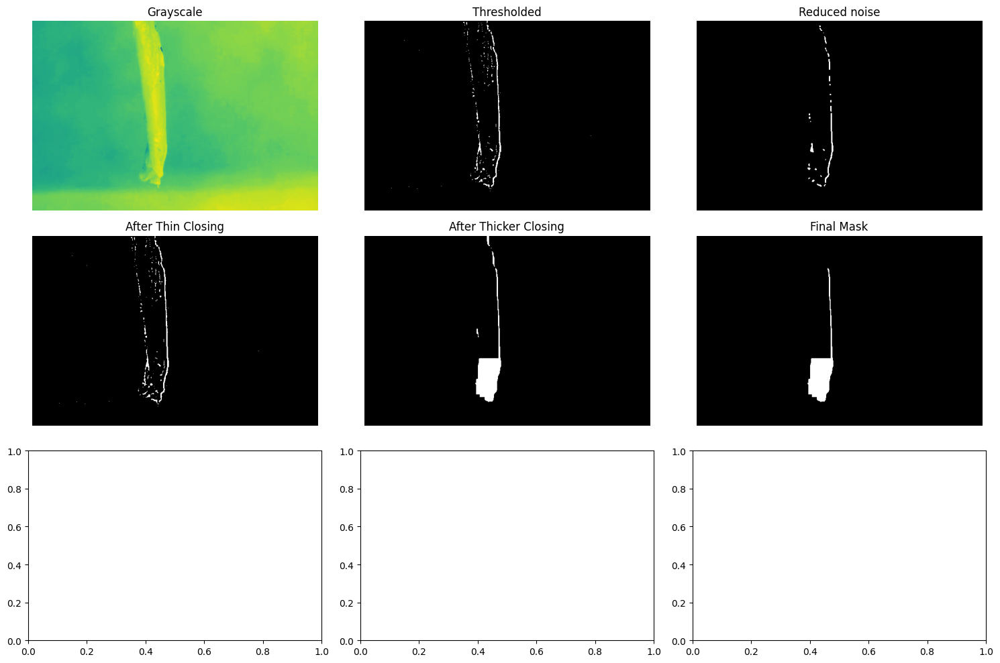

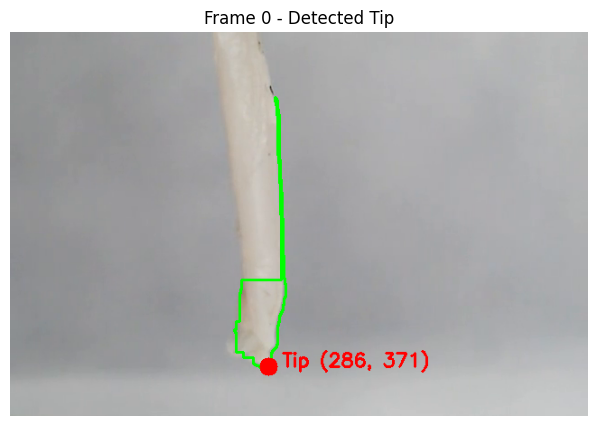

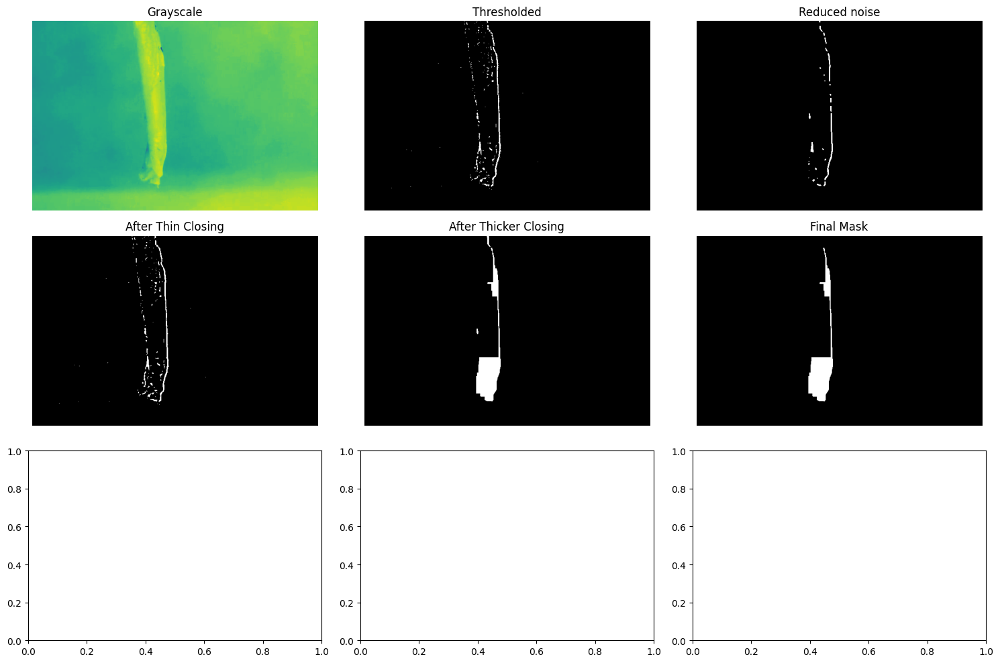

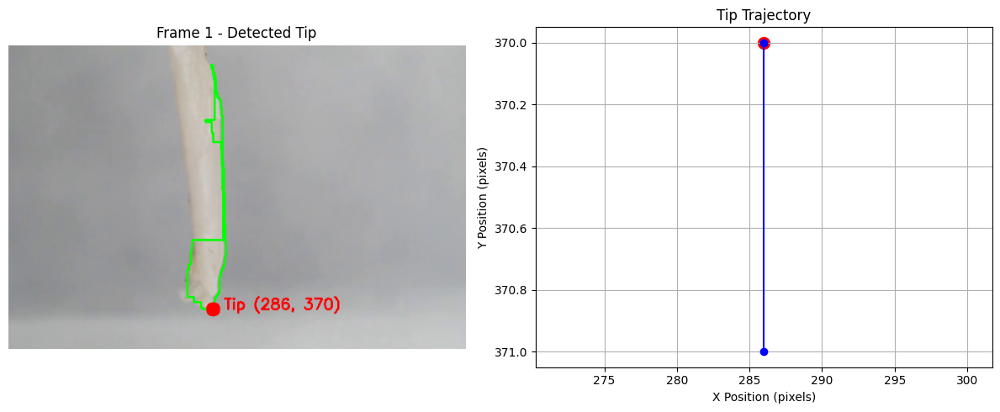

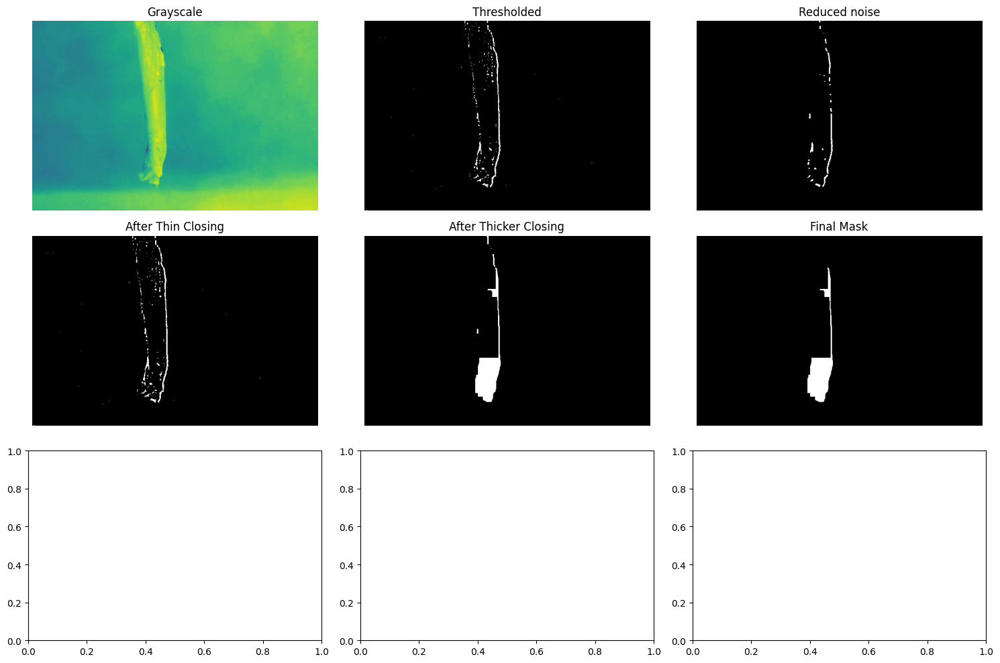

...

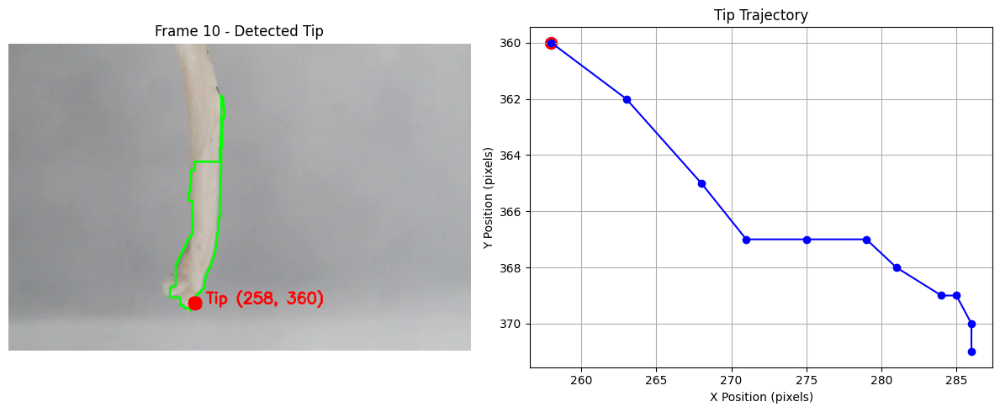

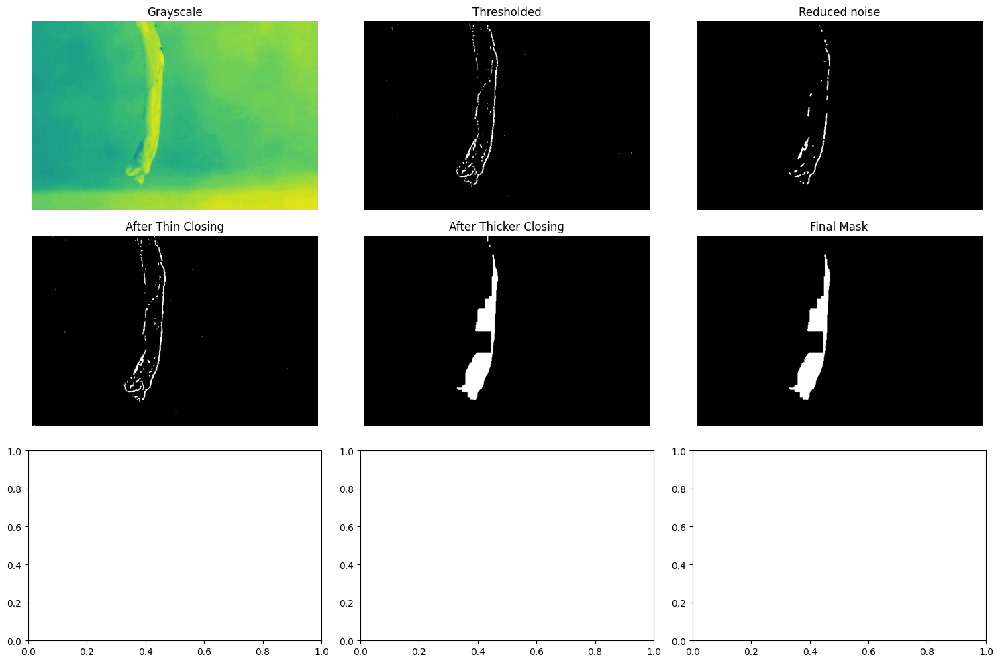

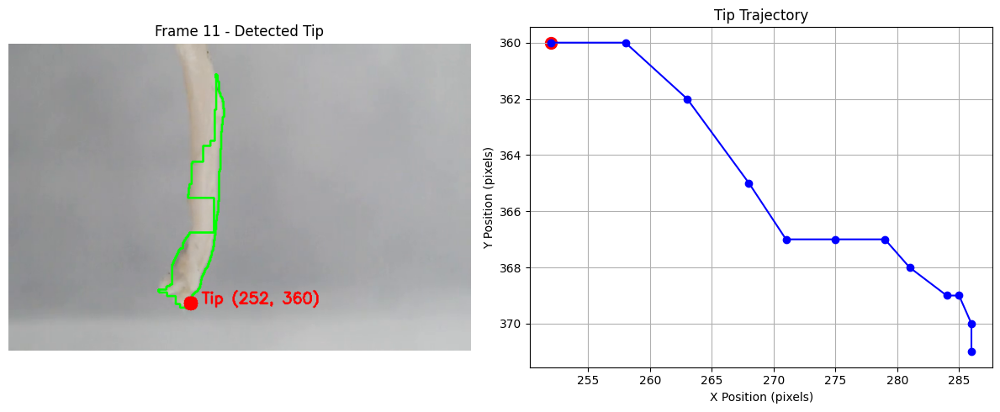

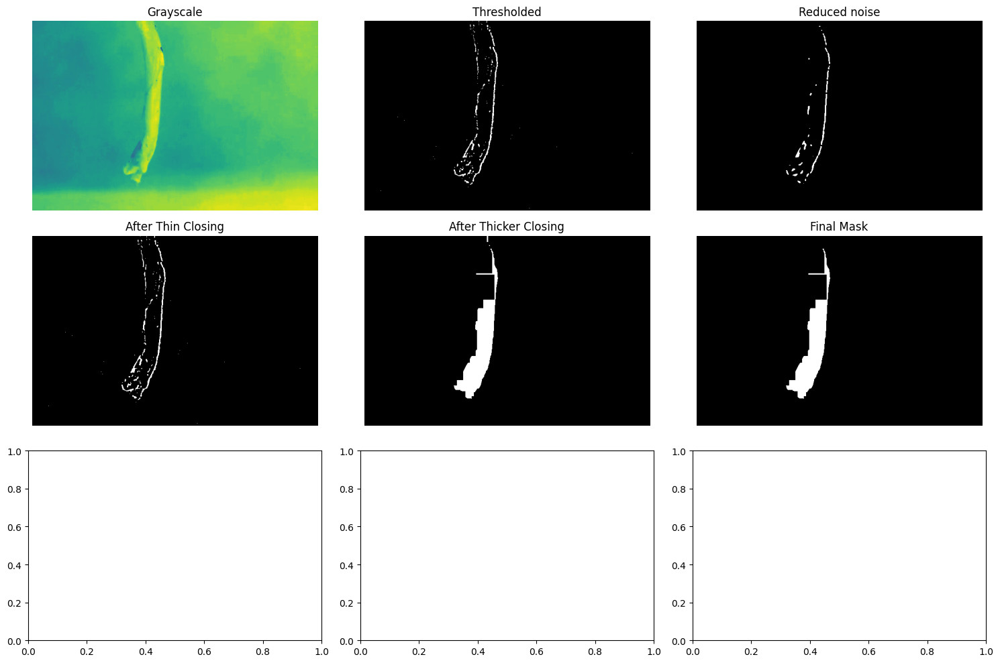

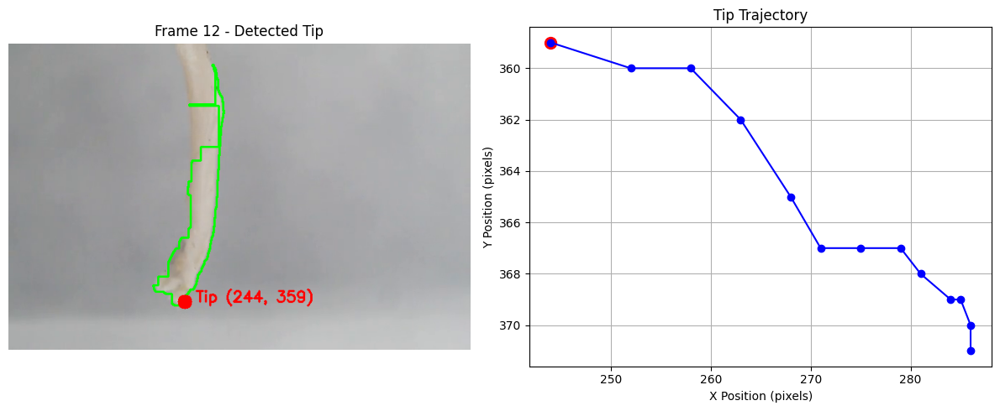

/var/folders/_t/vlf4bw_n38x9ytx94_479wt80000gp/T/ipykernel_22656/3182650465.py:56: RuntimeWarning: overflow encountered in ulong_scalars
  neighbor_count = np.sum(neighborhood) - skeleton[y, x]


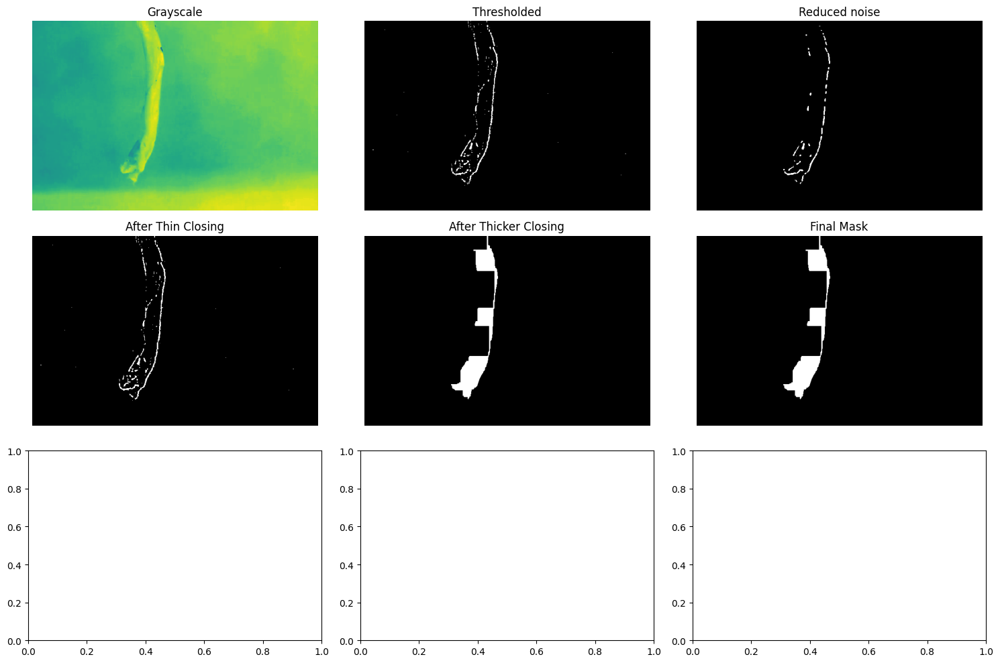

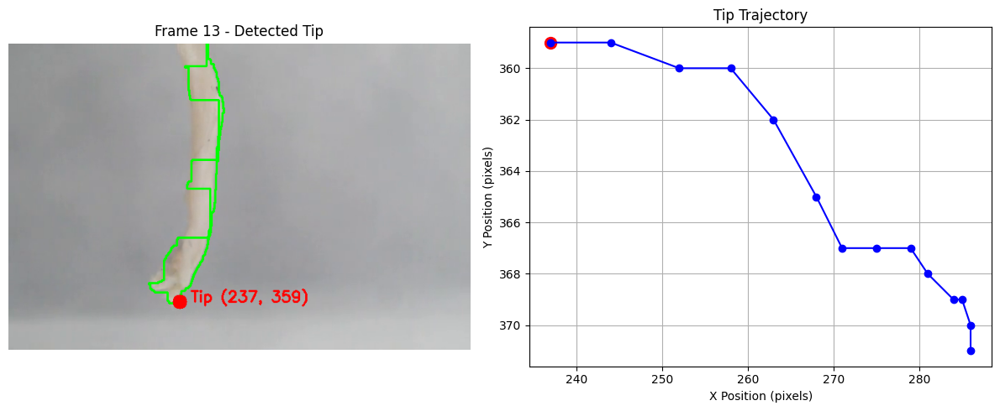

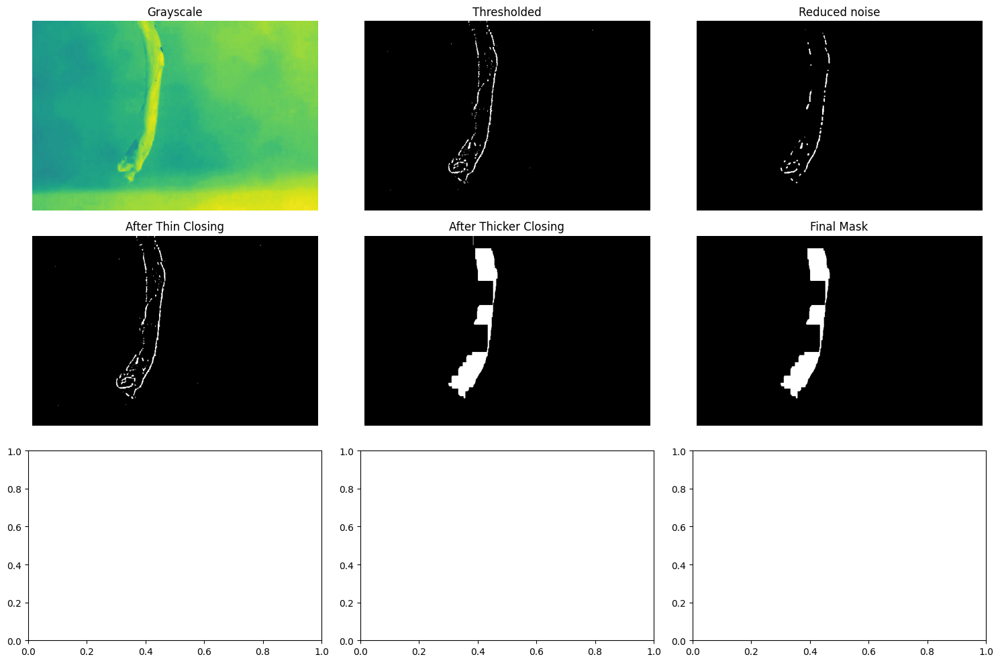

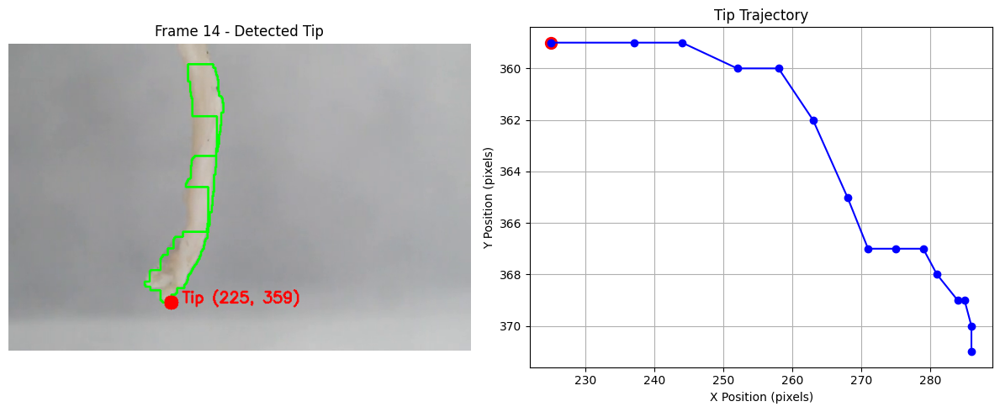

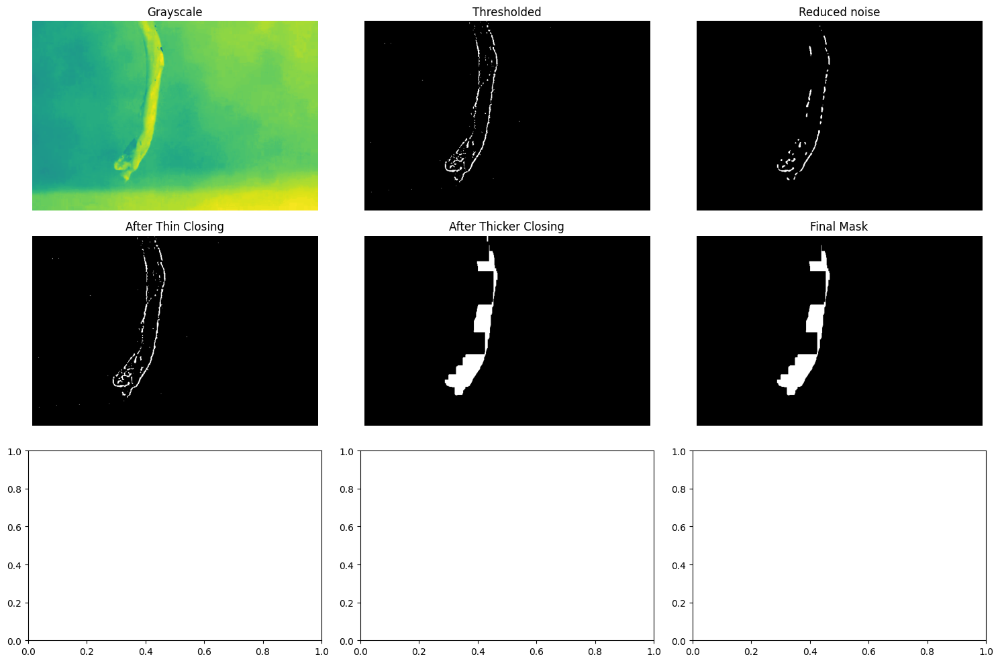

...

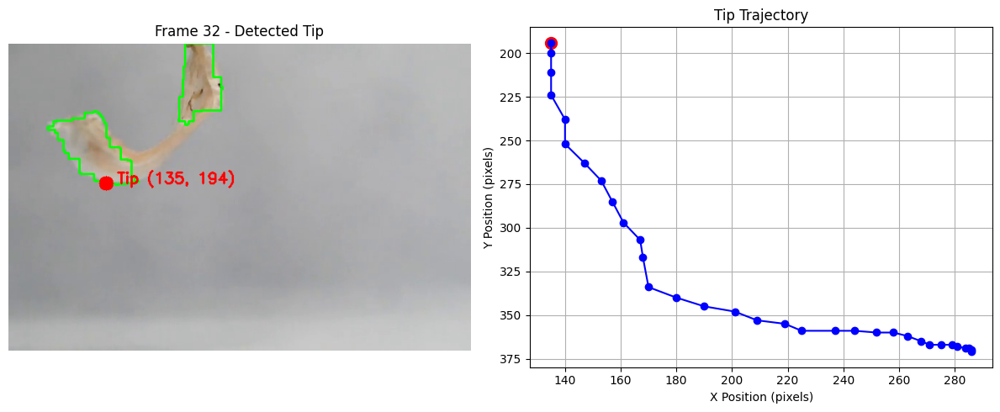

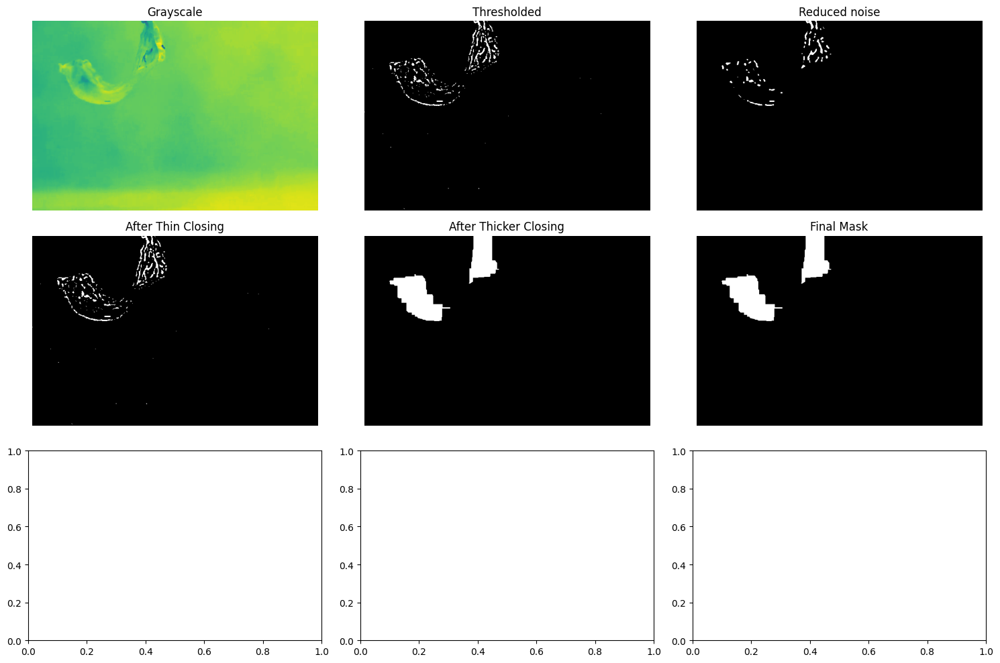

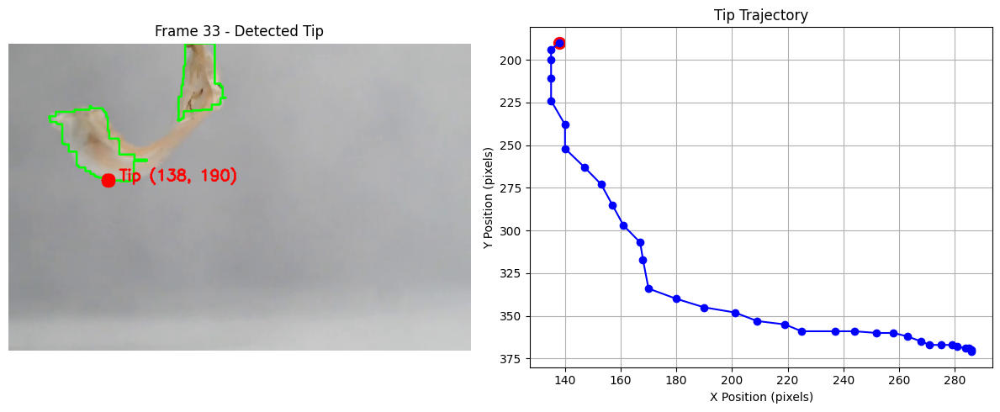

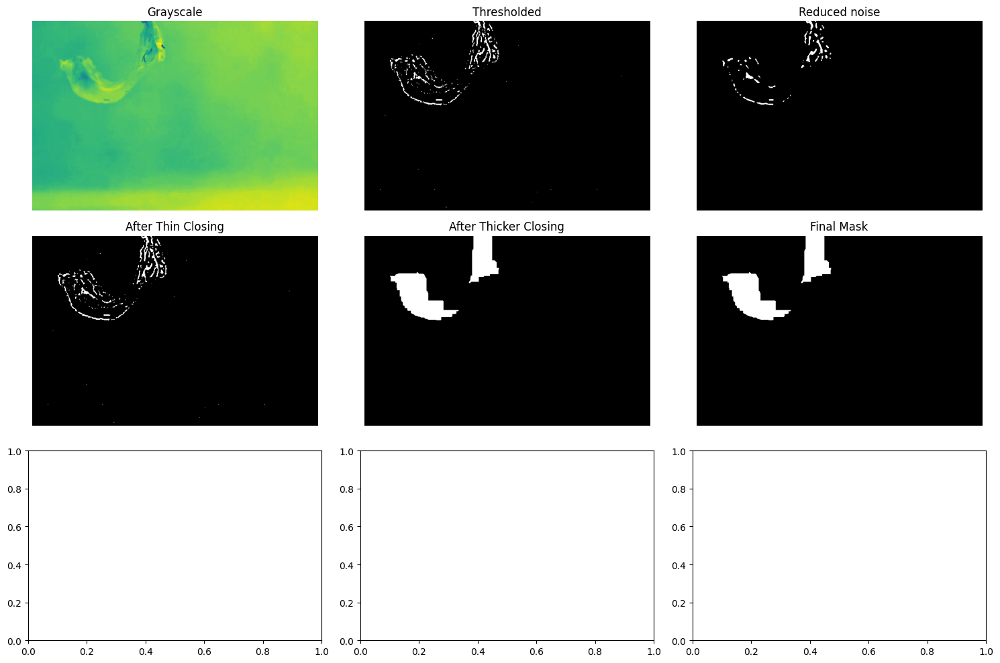

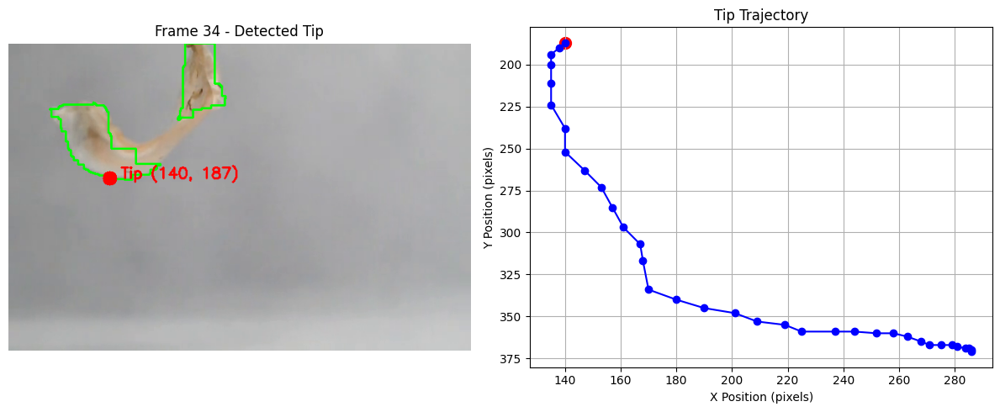

KeyboardInterrupt: 

In [195]:
# Set paths
video_path = "bimorph_videos/03.21.25_idx1_100x.mov"
temp_folder = "frames/"
start_frame = 22
end_frame = 60
frame_interval=0.6

extract_frames(video_path, temp_folder, interval=frame_interval)

track_actuator_tip(
    frame_folder=temp_folder,
    start_frame=start_frame,
    end_frame=end_frame,
    output_file="tracked.csv",
)